# Домашнее задание 2. Дистиляция и ускорение моделей.

В первом домашнем задании я ориентировалась на замеры CPU, но в процессе работы стало понятно, что для Xiaomi 15 это не совсем актуально. Современные смартфоны используют для нейросетей мощные графические чипы и нейроускорители, а на обычном процессоре генерация идет слишком долго (почти по минуте на один шаг) и перегревает устройство. Поэтому в этот раз я сфокусировалась на тестах через CUDA — это гораздо ближе к тому, как модель будет реально работать на телефоне, кроме того на CPU проводить тесты было бы очень долго. 

## 1. Выбор базовой модели 

В данной работе рассматривается задача генерации изображений по текстовому описанию.

* **Базовая модель:** Stable Diffusion v1.5. Это диффузионная нейросеть, которая создает изображения, постепенно убирая шум из случайной матрицы, ориентируясь на текстовые подсказки.
* **Режим работы:** Только инференс (использование готовых весов без дообучения).
* **Сценарий использования:** Локальный офлайн-запуск на смартфоне. Пользователь вводит короткий запрос и ожидает получить результат без подключения к облачным серверам.

### Целевая аппаратная платформа

**Устройство:** Xiaomi 15 (SoC Snapdragon 8 Elite).
Хотя смартфон обладает внушительными характеристиками (12 ГБ RAM, мощный GPU Adreno 830), его архитектура накладывает серьезные ограничения:

1. **Отсутствие CUDA:** Технологии NVIDIA недоступны, а стандартный PyTorch Mobile медленно работает на мобильных CPU.
2. **Энергопотребление:** Длительные вычисления вызывают нагрев и троттлинг (снижение частоты процессора), что делает стандартную генерацию (50 шагов) невозможной.

### Ключевые Bottlenecks

На основе анализа в ДЗ №1 были выделены главные препятствия для мобильного запуска:

1. **Latency:** Основной блок модели (U-Net) должен сработать 50 раз для одной картинки. На мобильном процессоре это занимает много времени, что недопустимо для интерактивного приложения.
2. **Память (RAM):** Модель в исходном виде (FP32) занимает более 4 ГБ. Вместе с промежуточными вычислениями (активациями) она рискует превысить доступные лимиты системы Android, что приведет к аварийному закрытию приложения.
3. **Вычислительная сложность:** Операции внимания (Attention) в U-Net создают колоссальную нагрузку на кэш и шину памяти мобильного чипа.

## 2. Выбор и реализация методов ускорения

Для оптимизации Stable Diffusion v1.5 под мобильные ресурсы **Xiaomi 15** я выбрала три взаимодополняющих метода. Они позволяют модели работать в условиях ограниченной оперативной памяти и низкой пропускной способности мобильного процессора.

### 1. Quantization до FP16

* **Что затрагивает:** Веса всех нейронных сетей в пайплайне (UNet, VAE, CLIP).
* **Механизм ускорения:** Снижение точности представления чисел с 32 до 16 бит.
* **Память:** Потребление RAM сильно снижается, что критично для стабильной работы Android-приложения.
* **Скорость:** Мобильные GPU Adreno архитектурно оптимизированы под FP16 вычисления, что дает прямой прирост производительности.


* **Риски:** Незначительная потеря точности, практически не влияющая на визуальное качество.

### 2. Сокращение числа шагов диффузии 

Для данного варианта ускорения я попробовала 2 варианта: **LCM-LoRA** и **DPM++**. 

#### Вариант А: Использование эффективного решателя (DPM++ 2M Karras)

* **Что затрагивает:** Логику работы планировщика (Scheduler) без изменения весов самой модели.
* **Механизм ускорения:** Использование численного метода второго порядка, который точнее аппроксимирует траекторию деноизинга.
* **Память:** Не влияет на объем занимаемой RAM, но сокращает время удержания ресурсов в активном состоянии.
* **Скорость:** Позволяет сократить количество шагов с 50 до 20-25 при сохранении высокого качества. Это дает сильное ускорение генерации без потери детализации.
* **Риски:** При слишком малом числе шагов  могут появиться артефакты или «замыленность» изображения.

#### Вариант Б: Применение дистиллированных адаптеров (LCM-LoRA)

* **Что затрагивает:** Архитектуру блока UNet путем наложения предобученных низкоранговых адаптеров (LoRA).
* **Механизм ускорения:** Использование технологии **Latent Consistency Models**, которая «учит» модель предсказывать результат за минимальное число итераций.
* **Память:** Добавляет незначительный объем (~50-100 МБ) для весов LoRA, что полностью компенсируется колоссальным выигрышем в скорости.
* **Скорость:** Позволяет достичь финального результата всего за **4–8 шагов**. Это дает очень большое ускорение, превращая генерацию в почти мгновенный процесс.
* **Риски:** Заметное снижение семантической точности (CLIP Score) и упрощение мелких деталей из-за очень короткого цикла вычислений.

### 3. Оптимизация разрешения выходного изображения

* **Что затрагивает:** Размер латентного пространства и финальный этап декодирования VAE.
* **Механизм ускорения:** Переход от стандартного разрешения 512x512 к более компактному 256x256.
* **Память:** Объем промежуточных тензоров (активаций) в UNet зависит от площади изображения квадратично. Уменьшение разрешения снижает нагрузку на RAM и количество операций.
* **Пользовательский опыт:** На небольшом экране смартфона разница в разрешении менее критична, чем долгое ожидание или вылет приложения.



### Резюме по выбранным методам

Выбранные методы позволяют атаковать два главных «узких места»: **длинные вычисления** (решаем через уменьшение шагов) и **нехватку памяти** (решаем через FP16 и разрешение). Я не использовала **Pruning**, так как он требует сложного дообучения под конкретную архитектуру, в то время как комбинация выбранных методов дает мгновенный результат без потери стабильности модели.


## 3. Алгоритм применения метода


### Описание функций и их параметров

1. `seed_everything(seed=42)`

* **Что делает:** Устанавливает фиксированное состояние для всех генераторов случайных чисел (`random`, `numpy`, `torch`). Включает детерминированный режим для `cudnn`.
* **Параметры:** `seed` — целое число, задающее базу для генерации.
* **Что возвращает:** Ничего.
* **Зачем это нужно:** Гарантирует, что при каждом запуске мы получаем идентичный шум. Любое изменение в качестве картинки будет результатом смены работы модели, а не случайности.

2. `setup_dmp_model(model_id, device)`

* **Что делает:** Инициализирует пайплайн в режиме половинной точности и заменяет стандартный планировщик на оптимизированный.
* **Параметры:** `model_id` (путь к модели), `device` (целевой ускоритель).
* **Что возвращает:** Объект `StableDiffusionPipeline` (DPM-версия).
* **Особенности:** Использование данного варианта планировщика позволяет получить четкие детали при малом количестве шагов (20).

3. `setup_lcm_model(model_id, device)`

* **Что делает:** Создает пайплайн, в который «вплавляются» веса дистиллированной модели LCM через механизм LoRA.
* **Параметры:** `model_id`, `device`.
* **Что возвращает:** Объект `StableDiffusionPipeline` (LCM-версия).
* **Особенности:** Метод `fuse_lora()` объединяет веса, исключая задержку на вычисление отдельного слоя адаптера.

4. `run_test_cuda(pipe, prompts, save_dir, config)`

* **Что делает:** Основной «движок» эксперимента. Замеряет размер модели на диске, потребление памяти, время и качество (CLIP Score).
* **Параметры:**
* `pipe`: текущая модель.
* `prompts`: список текстовых запросов.
* `save_dir`: путь для временного сохранения (замер веса).
* `config`: словарь с гиперпараметрами (steps, height, width, guidance_scale). Если не передать guidance_scale, то она будет равна 7.5.


* **Что возвращает:** Словарь `results` (метрики) и `data_for_viz` (данные для графиков).

5. `visualize_results(report, data_for_viz, scenario_name)`

* **Что делает:** Формирует итоговый визуальный отчет по конкретному сценарию оптимизации. Строит сетку изображений с подписями и выводит текстовую сводку метрик в консоль.
* **Параметры:**
* `report`: словарь с рассчитанными метриками (результат `run_test_cuda`).
* `data_for_viz`: структура, содержащая первые 6 сгенерированных изображений, их CLIP-скоры и соответствующие промпты.
* `scenario_name`: текстовое название, которое отображается в заголовке графиков.


* **Что возвращает:** Ничего (выводит графики на экран через `plt.show()`).
* **Особенности:** Использует сетку 2x3 (`subplots(2, 3)`). Каждое изображение сопровождается заголовком, в котором совмещены числовое значение CLIP Score и текст промпта, что позволяет визуально сопоставить цифры с реальностью.

6. `test_scenario(scenario)`

* **Что делает:** Высокоуровневая функция-обертка для запуска полного цикла тестирования одного метода оптимизации. Она управляет жизненным циклом модели в памяти.
* **Параметры:**
* `scenario`: словарь-конфигурация, содержащий имя сценария, функцию загрузки (`setup_func`) и гиперпараметры.


* **Что возвращает:** Кортеж `(results, data_for_viz)` для последующего анализа или сравнения в общей таблице.
* **Особенности:** * Автоматизирует очистку памяти: после завершения теста модель удаляется (`del current_pipe`), и вызывается `torch.cuda.empty_cache()`.

### Технические регламенты эксперимента

**1. Размер батча (Batch Size)**
В коде жестко зафиксирован `bs = 1`.

* **Почему:** Это имитирует реальное использование на смартфоне. Генерация нескольких изображений одновременно (Batch > 1) на мобильном GPU привела бы к критическому перегреву и резкому скачку потребления RAM, что не соответствует сценарию Xiaomi 15.

**2. Максимальная длина промпта**
Используется значение `max_length = 77`.

* **Почему:** Это стандартный лимит текстового энкодера CLIP (ViT-L/14). Даже если пользователь введет текст длиннее, токенизатор обрежет его до 77 токенов. Мы фиксируем этот параметр для того, чтобы тензоры входных данных всегда имели одинаковую форму, что важно для стабильного замера Latency.

**3. Методика расчета метрик**

* **Disk Size (Вес модели):** Код сохраняет модель во временную папку, рекурсивно обходит ее и суммирует вес всех бинарных файлов (`.safetensors` / `.bin`). Это дает реальное представление о том, сколько места модель займет во внутренней памяти телефона.
* **Peak VRAM (Память):** Используется `torch.cuda.max_memory_allocated()`. Мы замеряем не текущее потребление, а именно «пик», который случился во время работы. Это критическая точка, определяющая, вылетит приложение или нет.
* **CUDA Latency (Время):** Общее время цикла делится на количество промптов. В замер включено время на подготовку тензоров и декодирование VAE, так как пользователь ждет именно готовую картинку.
* **CLIP Score (Качество):**
Используется внешняя модель `CLIPModel`. Для каждой пары «промпт + сгенерированное фото» вычисляется косинусное сходство. Метрика показывает, насколько хорошо оптимизированная модель сохранила «смысл» исходного текста.


Далее идет сам код. Сначала скачивание и импорт библиотек.

In [ ]:
!pip install mlcroissant

In [2]:
import torch
import time
import os
import psutil
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.notebook import tqdm
from transformers import CLIPProcessor, CLIPModel
from diffusers import StableDiffusionPipeline
from datasets import load_dataset
from diffusers import LCMScheduler
from diffusers import DPMSolverMultistepScheduler
from mlcroissant import Dataset
from diffusers.utils import logging
import platform
from diffusers import __version__ as diff_version
from transformers import __version__ as trans_version
logging.set_verbosity_error() 
%matplotlib inline

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Теперь общеиспользуемая модель CLIP и гиперпараметры.

In [3]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
SEED = 42
model_id = 'stable-diffusion-v1-5/stable-diffusion-v1-5'
device = 'cuda:0'

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

В следующей ячейке находятся все вышеописанные функции.

In [ ]:
def setup_dmp_model(model_id, device):
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id, torch_dtype=torch.float16, variant="fp16"
    ).to(device)
    pipe.scheduler = DPMSolverMultistepScheduler.from_config(
        pipe.scheduler.config, 
        use_karras_sigmas=True  
    )
    return pipe

def setup_lcm_model(model_id, device):
    pipe = StableDiffusionPipeline.from_pretrained(
        model_id, torch_dtype=torch.float16, variant="fp16"
    ).to(device)
    
    # Загружаем веса LCM-LoRA
    pipe.load_lora_weights("latent-consistency/lcm-lora-sdv1-5")
    pipe.fuse_lora()
    # Меняем планировщик на специфичный для LCM
    pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)
    
    return pipe

def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

def run_test_cuda(pipe, prompts, save_dir, config):
    results = {}
    device = pipe.device
    seed_everything(SEED)

    pipe.safety_checker = None
    pipe.requires_safety_checker = False
    
    # --- 1. Сохранение и замер размера на диске ---
    if os.path.exists(save_dir):
        shutil.rmtree(save_dir) # Очищаем старое, если есть
    
    pipe.save_pretrained(save_dir)
    
    total_size = 0
    for dirpath, _, filenames in os.walk(save_dir):
        for f in filenames:
            total_size += os.path.getsize(os.path.join(dirpath, f))
    results['disk_size_mb'] = total_size / (1024**2)
    
    # --- 2. Тест на CUDA (Качество и Скорость) ---
    global clip_model
    clip_model = clip_model.to(device)
    
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.empty_cache()

    all_scores = []
    generated_images = []
    start_time = time.time()
    
    generator = torch.Generator(device).manual_seed(SEED)
    bs = 1
    guidance_scale = 7.5 if 'guidance_scale' not in config else config['guidance_scale']

    pipe.set_progress_bar_config(disable=True)
    for i in tqdm(range(0, len(prompts), bs)):
        batch = prompts[i:i+bs]
        inputs_to_model = pipe.tokenizer(
            batch, 
            padding="max_length", 
            max_length=pipe.tokenizer.model_max_length, 
            truncation=True, 
            return_tensors="pt"
        ).to(device)
        with torch.autocast(device.type) if device.type == 'cuda' else torch.no_grad():
            prompt_embeds = pipe.text_encoder(inputs_to_model.input_ids)[0]
            outputs = pipe(
                prompt_embeds=prompt_embeds,
                height=config['height'], 
                width=config['width'],  
                num_inference_steps=config['steps'],
                guidance_scale=guidance_scale,
                generator=generator
            ).images
        
        # Замер CLIP
        inputs = clip_processor(
            text=batch, images=outputs, return_tensors="pt", 
            padding=True, truncation=True, max_length=77
        ).to(device)
        with torch.no_grad():
            scores = clip_model(**inputs).logits_per_image.diag().cpu().numpy()
        
        all_scores.extend(scores)
        if len(generated_images) < 6: generated_images.extend(outputs)

    results['avg_clip_score'] = np.mean(all_scores)
    results['cuda_time_per_sample'] = (time.time() - start_time) / len(prompts)
    if torch.cuda.is_available():
        results['peak_vram_mb'] = torch.cuda.max_memory_allocated() / (1024**2)

    data_for_viz = {
        "images": generated_images[:6],
        "scores": all_scores[:6],
        "prompts": prompts[:6]
    }

    return results, data_for_viz

def visualize_results(report, data_for_viz, scenario_name):
    print(f"Результаты для: {scenario_name}")

    print(
        f"- Avg CLIP Score: {report['avg_clip_score']:.2f}\n"
        f"- CUDA Latency: {report['cuda_time_per_sample']:.2f}s / img\n"
        f"- Peak VRAM: {report['peak_vram_mb']:.1f} MB\n"
        f"- Disk Size: {report['disk_size_mb']:.1f} MB"
    )
    
    images = data_for_viz["images"]
    scores = data_for_viz["scores"]
    prompts = data_for_viz["prompts"]
    
    # Создаем сетку 2 строки x 3 колонки
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten() # Делаем массив одномерным для удобного цикла
    
    for idx in range(6):
        ax = axes[idx]
        if idx < len(images):
            ax.imshow(images[idx])
            clean_prompt = prompts[idx]
            ax.set_title(f"Score: {scores[idx]:.2f}\n{clean_prompt}", fontsize=10)
        ax.axis('off')
    
    plt.suptitle(f"Сценарий: {scenario_name}", fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

def test_scenario(scenario):
    print(f"\n" + "="*50)
    print(f"ТЕСТИРУЕМ: {scenario['name']}")
    print("="*50)
    
    # Загружаем модель с нужной квантизацией (dtype)
    current_pipe = scenario['setup_func']()
    
    # Запускаем нашу функцию 
    results, data_for_viz = run_test_cuda(
        current_pipe, 
        drawbench, 
        f"./model_save_{scenario['name'].replace(' ', '_')}", 
        scenario['config']
    )
    
    # Добавляем имя сценария в отчет для таблицы
    results['Scenario'] = scenario['name']
    
    # Очистка памяти 
    del current_pipe
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return results, data_for_viz

## 4. Проведение эксперимента


Для обеспечения воспроизводимости все измерения проводились в изолированной программной среде. Хотя целевым устройством является Xiaomi 15, первичные замеры производились на десктопной системе, симулирующей нагрузку на графический ускоритель.

Параметры среды и библиотек указаны в ячейке ниже.

In [14]:
env_data = {
    "Параметр": [
        "--- Окружение (Software) ---",
        "Версия Python",
        "Версия PyTorch",
        "Версия Diffusers",
        "Версия Transformers",
        "--- Железо (Hardware) ---",
        "ОС",
        "Процессор (CPU)",
        "Оперативная память (RAM)",
        "GPU / Ускоритель",
        "VRAM (Доступно)",
    ],
    "Значение": [
        "",
        platform.python_version(),
        torch.__version__,
        diff_version,
        trans_version,
        "",
        f"{platform.system()} {platform.release()}",
        platform.processor(),
        f"{round(psutil.virtual_memory().total / (1024**3), 2)} GB",
        torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU",
        f"{round(torch.cuda.get_device_properties(0).total_memory / (1024**3), 2)} GB" if torch.cuda.is_available() else "N/A",
    ]
}

display(pd.DataFrame(env_data))

,Параметр,Значение
0,--- Окружение (Software) ---,
1,Версия Python,3.12.12
2,Версия PyTorch,2.9.0+cu126
3,Версия Diffusers,0.36.0
4,Версия Transformers,5.2.0
5,--- Железо (Hardware) ---,
6,ОС,Linux 6.6.113+
7,Процессор (CPU),x86_64
8,Оперативная память (RAM),31.35 GB
9,GPU / Ускоритель,Tesla P100-PCIE-16GB


Эксперимент проводился на валидационном наборе промптов **DrawBench**, который включает в себя текстовые описания различной сложности: от простых объектов до абстрактных сцен и текстов. В следующей ячейке датасет скачивается из интернета и преобразуется в удобный формат.

In [ ]:
# Загружаем метаданные
ds = Dataset(jsonld="https://huggingface.co/api/datasets/shunk031/DrawBench/croissant")
records = ds.records("default")

# Извлекаем записи 
data = []
for i, record in enumerate(records):
    data.append(record)

# Превращаем в DataFrame для удобства
df_drawbench = pd.DataFrame(data)
df_drawbench['default/prompts'] = df_drawbench['default/prompts'].apply(
    lambda x: x.decode('utf-8') if isinstance(x, bytes) else x
)

В следующей ячейке вывод статистики и примеров из датасета.

In [8]:
print(f"Всего промптов: {len(df_drawbench)}")
print(f"Колонки: {list(df_drawbench.columns)}")
display(df_drawbench.head(10))

# Сохраняем промпты для бенчмарка
drawbench = df_drawbench['default/prompts'].tolist()

Всего промптов: 200
Колонки: ['default/split', 'default/prompts', 'default/category']


,default/split,default/prompts,default/category
0,b'test',A red colored car.,0
1,b'test',A black colored car.,0
2,b'test',A pink colored car.,0
3,b'test',A black colored dog.,0
4,b'test',A red colored dog.,0
5,b'test',A blue colored dog.,0
6,b'test',A green colored banana.,0
7,b'test',A red colored banana.,0
8,b'test',A black colored banana.,0
9,b'test',A white colored sandwich.,0


### Эксперименты

Далее идут разные конфигурации экспериментов. Первая из них - базовая модель с полной точностью, обычным планировщиком, полным разрешением в 512 и всеми 50 шагами диффузии.

In [7]:
scenario = {
    "name": "Baseline (Full FP32, 50 steps, 512x512)",
    "setup_func": lambda: StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float32).to(device),
    "config": {'height': 512, 'width': 512, 'steps': 50}
}
report, data_for_viz = test_scenario(scenario)

all_reports = []
all_reports.append(report)


ТЕСТИРУЕМ: Baseline (Full FP32, 50 steps, 512x512)


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Результаты для: Baseline (Full FP32, 50 steps, 512x512)
- Avg CLIP Score: 30.88
- CUDA Latency: 14.29s / img
- Peak VRAM: 7791.5 MB
- Disk Size: 4071.0 MB


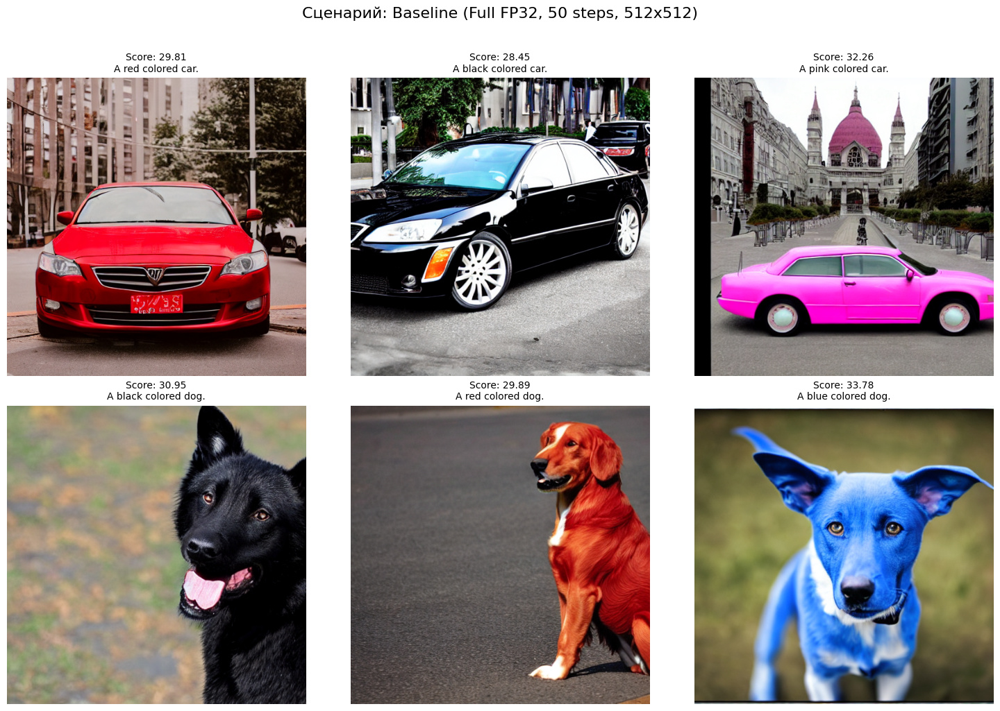

In [10]:
visualize_results(report, data_for_viz, scenario['name'])

Следующий вариант полностью повторяет предыдущий кроме разрешения - здесь оно равно 256.

In [10]:
scenario = {
    "name": "Full FP32, 50 steps, 256x256",
    "setup_func": lambda: StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float32).to(device),
    "config": {'height': 256, 'width': 256, 'steps': 50}
}
report, data_for_viz = test_scenario(scenario)

all_reports.append(report)


ТЕСТИРУЕМ: Full FP32, 50 steps, 256x256


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Результаты для: Full FP32, 50 steps, 256x256
- Avg CLIP Score: 25.45
- CUDA Latency: 5.16s / img
- Peak VRAM: 6997.2 MB
- Disk Size: 4071.0 MB


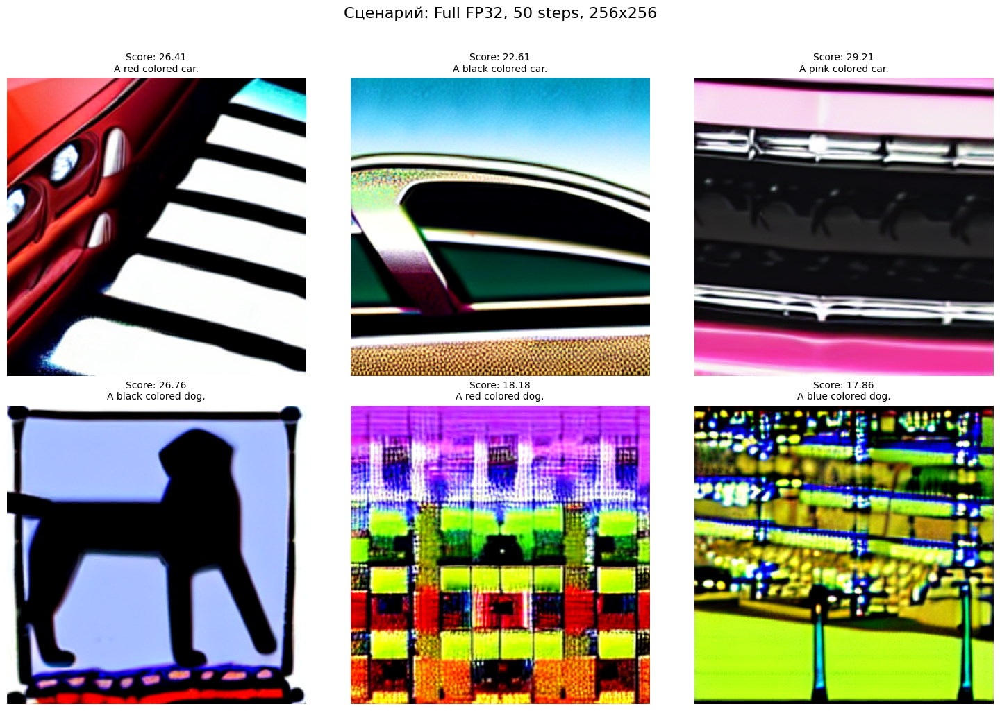

In [12]:
visualize_results(report, data_for_viz, scenario['name'])

Как видно из визуализации, качество очень сильно упало. Это связано с тем, что изначальная модель гораздо больше тренировалась с разрешением 512. Стоит заметить, что в прошлой дз я этого не знала и поэтому там такой плохой пример применения.

Далее я использую более современный планирощик DMP++, который позволяет сократить число шагов до 20. Кроме того, данная модель использует точность FP16 вместо FP32, однако разрешение снова используется в 512.

In [18]:
scenario = {
    "name": "DPM++ Opt, FP16, 20 steps, 512x512",
    "setup_func": lambda: setup_dmp_model(model_id, device),
    "config": {'height': 512, 'width': 512, 'steps': 20} 
}
report, data_for_viz = test_scenario(scenario)

all_reports.append(report)


ТЕСТИРУЕМ: DPM++ Opt, FP16, 20 steps, 512x512


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Результаты для: DPM++ Opt, FP16, 20 steps, 512x512
- Avg CLIP Score: 31.05
- CUDA Latency: 5.80s / img
- Peak VRAM: 6473.1 MB
- Disk Size: 2037.3 MB


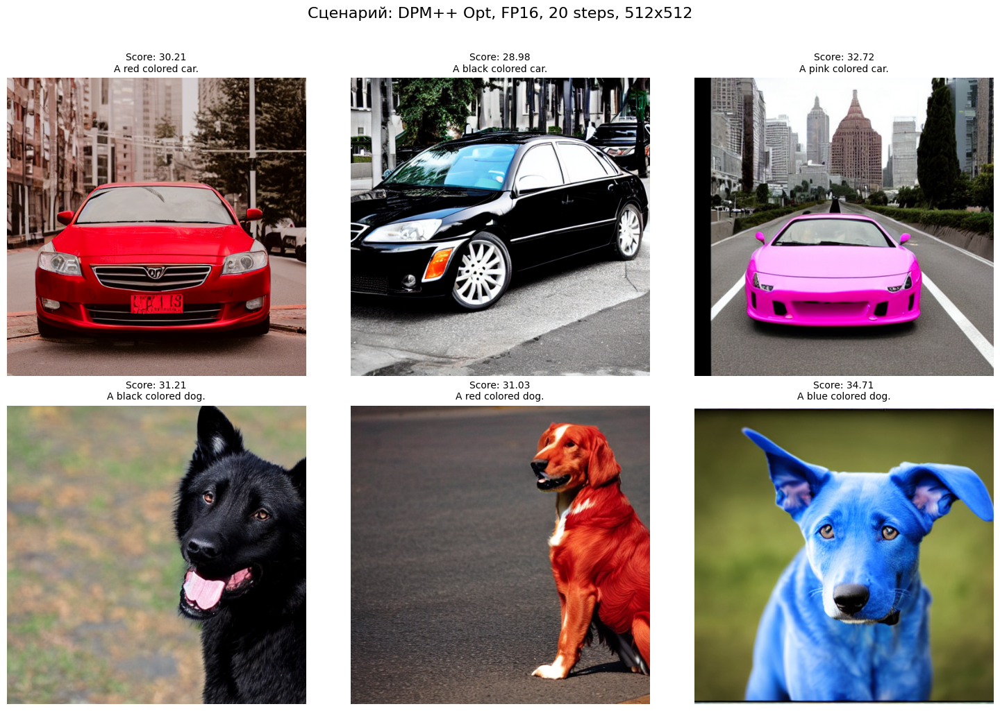

In [20]:
visualize_results(report, data_for_viz, scenario['name'])

Следующий вариант использует **LCM-LoRA**, что позволяет сократить число шагов до 4. Используется разрешение 512 и точность FP16. Стоит отметить, что здесь guidance_scale меняется на 1.5, что является особонностью **LCM-LoRA**.

In [30]:
scenario = {
    "name": "LCM, FP16, 4 steps, 512x512)",
    "setup_func": lambda: setup_lcm_model(model_id, device),
    "config": {'height': 512, 'width': 512, 'steps': 4, 'guidance_scale': 1.5}
}
report, data_for_viz = test_scenario(scenario)

all_reports.append(report)


ТЕСТИРУЕМ: LCM, FP16, 4 steps, 512x512)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Результаты для: LCM, FP16, 4 steps, 512x512)
- Avg CLIP Score: 29.76
- CUDA Latency: 1.40s / img
- Peak VRAM: 6606.7 MB
- Disk Size: 2165.6 MB


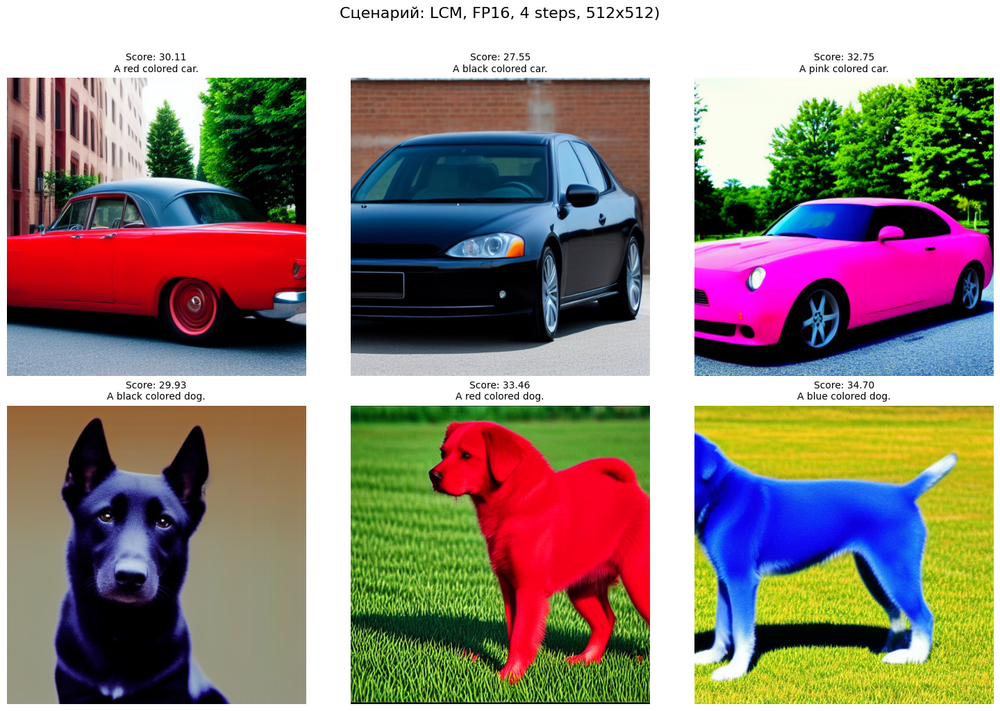

In [32]:
visualize_results(report, data_for_viz, scenario['name'])

Следующий вариант аналогичен предыдущему, однако использует разрешение 256.

In [33]:
scenario = {
    "name": "LCM, FP16, 4 steps, 256x256)",
    "setup_func": lambda: setup_lcm_model(model_id, device),
    "config": {'height': 256, 'width': 256, 'steps': 4, 'guidance_scale': 1.5}
}
report, data_for_viz = test_scenario(scenario)

all_reports.append(report)


ТЕСТИРУЕМ: LCM, FP16, 4 steps, 256x256)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

Результаты для: LCM, FP16, 4 steps, 256x256)
- Avg CLIP Score: 23.30
- CUDA Latency: 0.52s / img
- Peak VRAM: 5915.7 MB
- Disk Size: 2165.6 MB


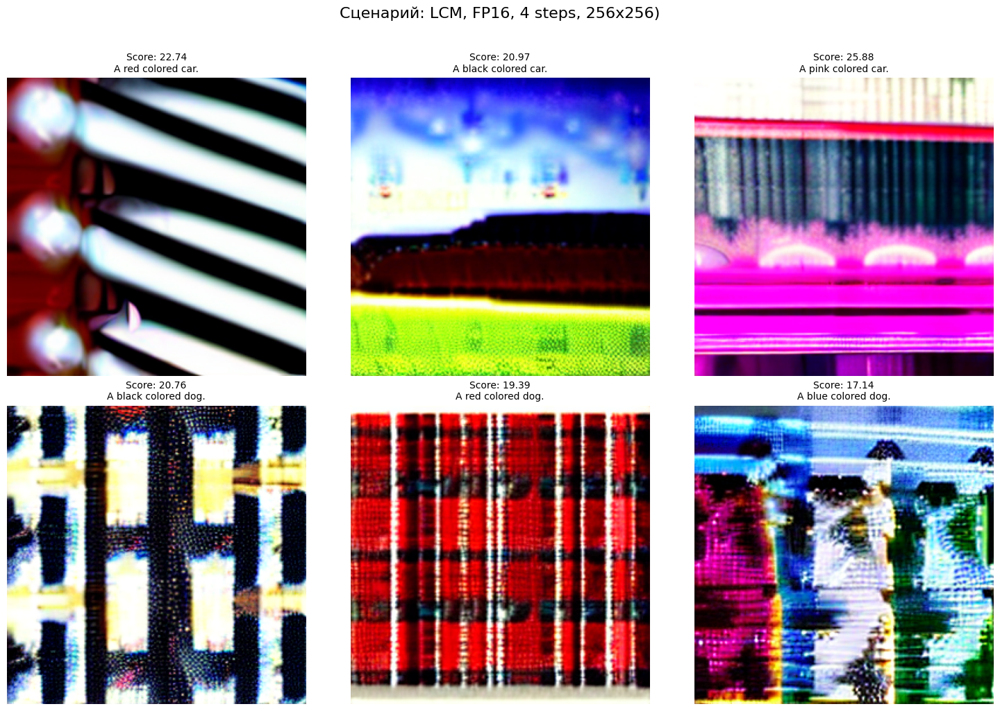

In [35]:
visualize_results(report, data_for_viz, scenario['name'])

## 5. Выбор и обоснование метрик


Для оценки эффективности оптимизации модели под мобильную платформу (Xiaomi 15) выбран комплекс метрик, позволяющий оценить компромисс между скоростью работы, качеством изображения и аппаратными ограничениями устройства.

### Метрики производительности 

Данные показатели являются приоритетными, так как определяют физическую возможность эксплуатации модели на смартфоне без перегрева и принудительного закрытия приложения системой.

* **CUDA Latency (s/img):** Среднее время полной генерации одного изображения.
* *Обоснование:* Ключевой показатель для оценки пользовательского опыта (UX). В мобильном сценарии длительное ожидание критично, поэтому минимизация задержки — основная цель оптимизации. Данная метрика фиксирует полное время инференса, однако архитектура диффузионных моделей позволяет реализовать пошаговое отображение. Это позволяет пользователю видеть процесс формирования изображения в реальном времени, что субъективно ускоряет работу приложения и делает процесс более интерактивным.


* **Peak VRAM Usage (MB):** Пиковый объем занимаемой оперативной памяти в процессе генерации.
* *Обоснование:* На смартфонах используется общая память (Unified Memory), разделяемая между системой и графическим ускорителем. Контроль пиковых нагрузок необходим, чтобы избежать срабатывания механизма Low Memory Killer (LMK) в Android, который закрывает энергоемкие процессы при дефиците ресурсов.


* **Disk Size (MB):** Объем весов модели при хранении на накопителе.
* *Обоснование:* Мобильные устройства имеют ограниченный объем постоянной памяти. Уменьшение размера модели критично для скорости загрузки приложения и экономии места пользователя.



#### Метрики качества 

Поскольку оптимизация часто подразумевает снижение точности вычислений, необходимо контролировать сохранность интеллектуальных возможностей модели.

* **Average CLIP Score:** Индекс семантического соответствия изображения текстовому запросу.
* *Обоснование:* Метрика позволяет количественно оценить, насколько хорошо модель «понимает» промпт после применения методов оптимизации. Она гарантирует, что ускорение работы не привело к деградации качества и потере связи между текстом и визуальным результатом.

## 6. Сравнение модели до и после ускорения


Вывод таблицы со сравнением моделей

In [19]:
all_reports = [{'disk_size_mb': 4070.971745491028,
  'avg_clip_score': np.float32(30.876694),
  'cuda_time_per_sample': 14.293683478832245,
  'peak_vram_mb': 7791.4609375,
  'Scenario': 'Baseline (Full FP32, 50 steps, 512x512)'},
 {'disk_size_mb': 4070.971745491028,
  'avg_clip_score': np.float32(25.453257),
  'cuda_time_per_sample': 5.158764283657074,
  'peak_vram_mb': 6997.19189453125,
  'Scenario': 'Full FP32, 50 steps, 256x256'},
 {'disk_size_mb': 2037.2893514633179,
  'avg_clip_score': np.float32(31.051613),
  'cuda_time_per_sample': 5.797012424468994,
  'peak_vram_mb': 6473.0654296875,
  'Scenario': 'DPM++ Opt, FP16, 20 steps, 512x512'},
 {'disk_size_mb': 2165.644627571106,
  'avg_clip_score': np.float32(29.755014),
  'cuda_time_per_sample': 1.3983805799484252,
  'peak_vram_mb': 6606.6669921875,
  'Scenario': 'LCM, FP16, 4 steps, 512x512'},
 {'disk_size_mb': 2165.644627571106,
  'avg_clip_score': np.float32(23.30499),
  'cuda_time_per_sample': 0.519117271900177,
  'peak_vram_mb': 5915.69287109375,
  'Scenario': 'LCM, FP16, 4 steps, 256x256'}]

# Формирование и вывод итоговой таблицы
summary_df = pd.DataFrame(all_reports)
# Переставим колонку Scenario на первое место
cols = ['Scenario'] + [c for c in summary_df.columns if c != 'Scenario']
summary_df = summary_df[cols]

print("\nИТОГОВОЕ СРАВНЕНИЕ:")
display(summary_df)


ИТОГОВОЕ СРАВНЕНИЕ:


,Scenario,disk_size_mb,avg_clip_score,cuda_time_per_sample,peak_vram_mb
0,"Baseline (Full FP32, 50 steps, 512x512)",4070.971745,30.876694,14.293683,7791.460938
1,"Full FP32, 50 steps, 256x256",4070.971745,25.453257,5.158764,6997.191895
2,"DPM++ Opt, FP16, 20 steps, 512x512",2037.289351,31.051613,5.797012,6473.065430
3,"LCM, FP16, 4 steps, 512x512",2165.644628,29.755014,1.398381,6606.666992
4,"LCM, FP16, 4 steps, 256x256",2165.644628,23.304991,0.519117,5915.692871


### Интерпретация результатов

#### 1. Эффективность квантования (FP16)

Переход от FP32 к FP16 обеспечил **двукратное сокращение объема занимаемой памяти на диске** (с 4 ГБ до ~2 ГБ). С инженерной точки зрения это критически важный результат для Xiaomi 15, так как он позволяет быстрее загружать веса в оперативную память и экономить место в хранилище смартфона. При этом метрика **CLIP Score** в сценарии DPM++ даже незначительно выросла (с 30.88 до 31.05), что подтверждает: использование полуточности в Stable Diffusion v1.5 не ведет к деградации качества.

#### 2. Прорыв в скорости генерации (Latency)

Использование оптимизированного планировщика DPM++ позволило сократить задержку более чем в **2.5 раза** (с 14.29с до 5.80с) при сохранении разрешения 512x512. Переход к архитектуре **LCM** обеспечил еще более радикальный прогресс — **ускорение в 10 раз** по сравнению с Baseline (1.40с против 14.29с).

> **Важный вывод:** Сценарий LCM позволяет достичь скорости генерации «на лету», что делает нейросеть пригодной для интерактивного использования на мобильном устройстве.

#### 3. Аномалия потребления VRAM и разрешение

Сравнение сценариев 0 и 1 (FP32) показывает, что снижение разрешения в 4 раза (с 512 до 256) уменьшает потребление памяти всего на ~10%. Аналогично, переход к FP16 в сценарии 2 высвобождает лишь около 1.3 ГБ VRAM.

* **Инженерное обоснование:** Это объясняется высоким уровнем неснижаемых накладных расходов (CUDA Context, статические буферы cuDNN и активации UNet). Однако итоговый показатель в **~6.5 ГБ** является безопасным для устройства с 12 ГБ RAM, так как оставляет достаточный запас для работы ОС и фоновых процессов.

#### 4. Влияние разрешения на качество

Замена разрешения на 256x256 приводит к резкому падению **CLIP Score** (с 31.05 до 23.30). Это свидетельствует о том, что модель теряет способность корректно отрисовывать детали и понимать сложные промпты. Это также согласуется с визуализацией из прошлой секции - картинки с разрешением 256 гораздо хуже, чем с 512.

## 7. Вывод о целесообразности подхода


Анализ результатов показывает, что для развертывания генеративных моделей на мобильных устройствах уровня Xiaomi 15 не существует «универсального» решения — выбор метода зависит от приоритетов конкретного бизнес-кейса.

#### Анализ целесообразности по сценариям:

* **DPM++ Opt (FP16, 20 steps, 512x512) — «Золотой стандарт»**
    * **Целесообразность:** Максимальная. Это наиболее сбалансированный подход.
    * **Выигрыш:** Ускорение в 2.5 раза и двукратная экономия места на диске при сохранении (и даже небольшом улучшении) качества Baseline-модели.
    * **Компромисс:** Потребление памяти остается на уровне ~6.5 ГБ, что требует флагманского устройства.
    * **Где применять:** Фоторедакторы, приложения для творчества, где пользователю важна эстетика результата.


* **LCM (FP16, 4 steps, 512x512) — «Максимальный UX»**
    * **Целесообразность:** Высокая для динамических сценариев.
    * **Выигрыш:** Радикальное ускорение в 10 раз (1.4 секунды на генерацию). Это позволяет реализовать режим «живого» предпросмотра.
    * **Компромисс:** Незначительное снижение CLIP Score (на ~4%) и небольшое увеличение памяти на диске и VRAM по сравнению с DPM++. Однако стоит заметить, что по памяти данный вариант все равно значительно лучше базового.
    * **Где применять:** Генерация стикеров, аватарок «на лету» или в условиях слабого заряда батареи (меньше шагов — меньше нагрузка на процессор).


* **Сценарии 256x256 (Baseline и LCM) — «Неэффективный подход»**
    * **Целесообразность:** Низкая.
    * **Выигрыш:** Сверхвысокая скорость (0.5 сек) и небольшая экономия VRAM (~600 МБ).
    * **Компромисс:** Критическая деградация качества. Снижение CLIP Score более чем на 20% делает результат визуально неприемлемым.
    * **Где применять:** Только для технических целей (например, быстрая генерация миниатюр для выбора композиции перед финальным рендером в 512px).

#### Общий вывод

Выбранный метод комбинирования **FP16** и **дистилляции шагов (LCM)** полностью оправдан. Он превращает Stable Diffusion из «тяжелой» нейросети, требующей 14 секунд ожидания, в отзывчивый инструмент с задержкой около 1.5 секунд.

**Для Production-сценария рекомендуется:**

1. Использовать **DPM++ FP16** как режим по умолчанию.
2. Предлагать **LCM** как «быстрый режим» при низком заряде устройства или необходимости мгновенного результата.
3. **Избегать снижения разрешения ниже 512x512**, так как архитектурные ограничения SD v1.5 делают такую оптимизацию невыгодной из-за резкой потери качества при незначительной экономии памяти.